# Pixels and Images

A **pixel** is the smallest information in one image. In the case of images composed by 3 channels we have RGB (red, green, blue) information for each pixel.

Therefore, if we have an image with 32x32 pixels with 3 channels, the total of pixels is 32x32x3=3072.

In gray scale, we have the same value for red, green and blue. So, in this case, we reduce the amount of information needed.

# Haarcascades Classifier

To train an algorithm to recognize faces we need 2 sets of images, one with only images (positive set) of faces and other with only images that not contain faces (negative set).

To train we use **AdaBoost** (Adaptive Boosting)
  - AdaBoost can be used to improve the performance of others algorithms
  - AdaBoost is adaptive in the sense that subsequent weak learners are tweaked in favor of those instances misclassified by previous classifiers
  - In some problems it can be less susceptible to the overfitting problem than other learning algorithms
  - AdaBoost calls a weak classifier for T iterations. For each call, the weights distribution are updated. For each iteration, the weights in a wrong classification are increased.

Feature selection

<p align="center">
  <img src="https://www.bogotobogo.com/python/OpenCV_Python/images/FaceDetection/HaarFeatures.png" />
</p>

The filters are applied for each sub-window in image. A new matrix will be created where each coordinate will be the result of the sum of white pixels minus the sum of black pixels for each filter passed in all image.

<p align="center">
  <img src="https://upload.wikimedia.org/wikipedia/en/thumb/7/7d/Lenna_%28test_image%29.png/220px-Lenna_%28test_image%29.png" />

  <img width=300 height=221 src="https://miro.medium.com/max/640/1*XX8WqHo0lyrgZfTTRQ3ESQ.webp" />
</p>

The image, after trained the algorithm, will be sended for multiple classifiers. Each classifier is specialized in detecting a pattern.

<p align="center">
  <img width=600 src="https://www.researchgate.net/profile/Lahiru-Dinalankara/publication/318900718/figure/fig3/AS:523536918945792@1501832336269/Haar-cascade-flow-chart.png" />
</p>



## OpenCV (Open Source Computer Vision Library)

- Originally debeloped by Intel.

- For Computer Vision, have modules to process images and videos, filter images, object recognition, ...

- Developed in C/C++

In [1]:
import cv2 as cv

from google.colab.patches import cv2_imshow
from google.colab         import drive

drive.mount('/content/drive')

Mounted at /content/drive


### Load Image

In [2]:
img_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/images/people1.jpg"

img = cv.imread(img_url)

In [3]:
img.shape

(1280, 1920, 3)

In [4]:
# cv.imshow(img)

cv2_imshow(img)

print(f"\nTotal of pixels: {1280 * 1920 * 3}")

Output hidden; open in https://colab.research.google.com to view.

for some aplications, a image in large size will disturb the process because needs more time.

In [5]:
img = cv.resize(img, (800, 600))

img.shape

(600, 800, 3)

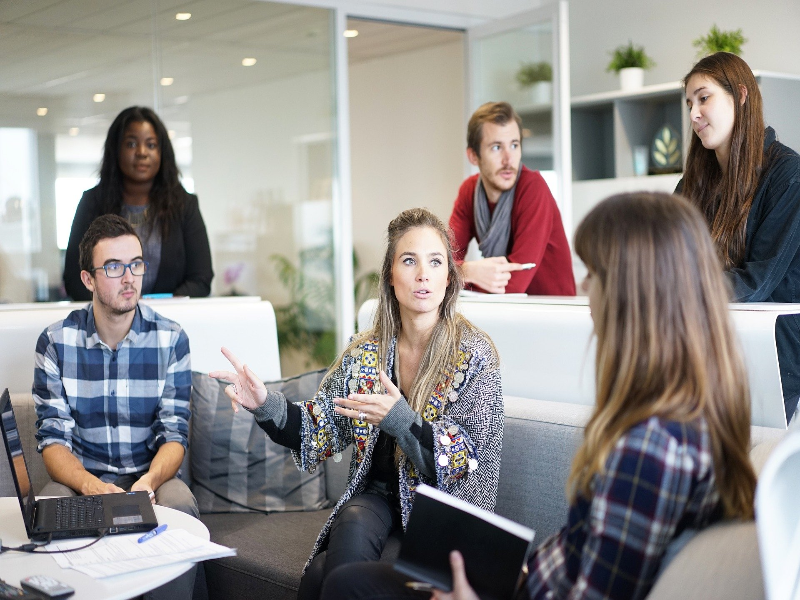


Total of pixels: 1440000


In [6]:
cv2_imshow(img)

print(f"\nTotal of pixels: {600 * 800 * 3}")

Now, we need to convert the image to gray scale

In [7]:
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

img_gray.shape

(600, 800)

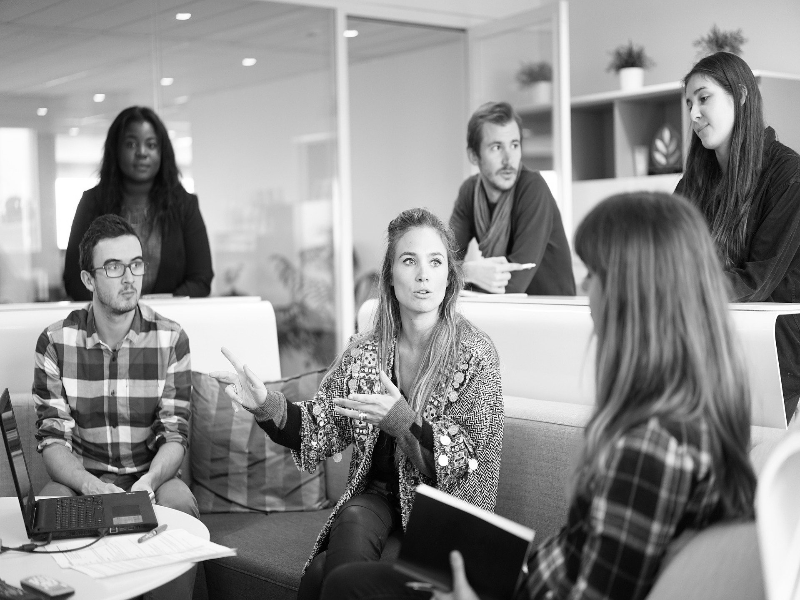


Total of pixels: 480000


In [8]:
cv2_imshow(img_gray)

print(f"\nTotal of pixels: {600 * 800}")

### Face Detection

The OpenCV makes available the trained algorithm. So, we only need to instantiate passing the path with the XML

In [9]:
haarcascades_face_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/cascades/haarcascade_frontalface_default.xml"

face_detector = cv.CascadeClassifier(haarcascades_face_url)

In [10]:
detections = face_detector.detectMultiScale(img_gray)

detections

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

creating bounding boxes in faces detected

In [11]:
YELLOW = (0, 255, 255) #BGR

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), YELLOW, thickness=2)

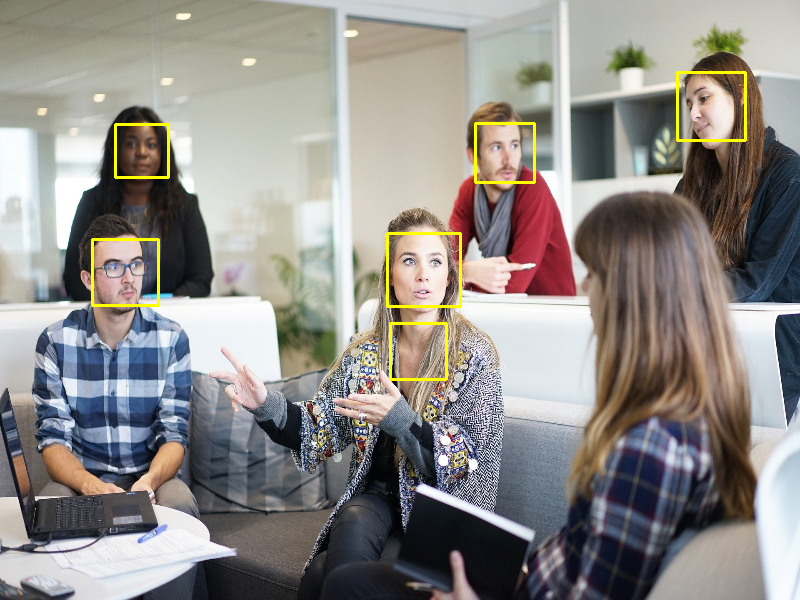

In [12]:
cv2_imshow(img)

#### Changing Parameters

On the image above is vissibble one <ins>false positive</ins>.

For the metrhod `detectMultiScale` in the detector we have:
- `image` : matrix contain an image
- `scaleFactor = 1.1` : (1, N] how much the image will be increased (good if have small faces in image)
- `minNeighbors = 3` : specify how many neighors each candidate rectangle should have to retain it
- `minSize` : minimum possible object size. Objects smaller than that are ignored.
- `maxSize` : maximum possible object size. Objects bigger than this are ignored.

In [13]:
img      = cv.imread(img_url)
img      = cv.resize(img, (800, 600))
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

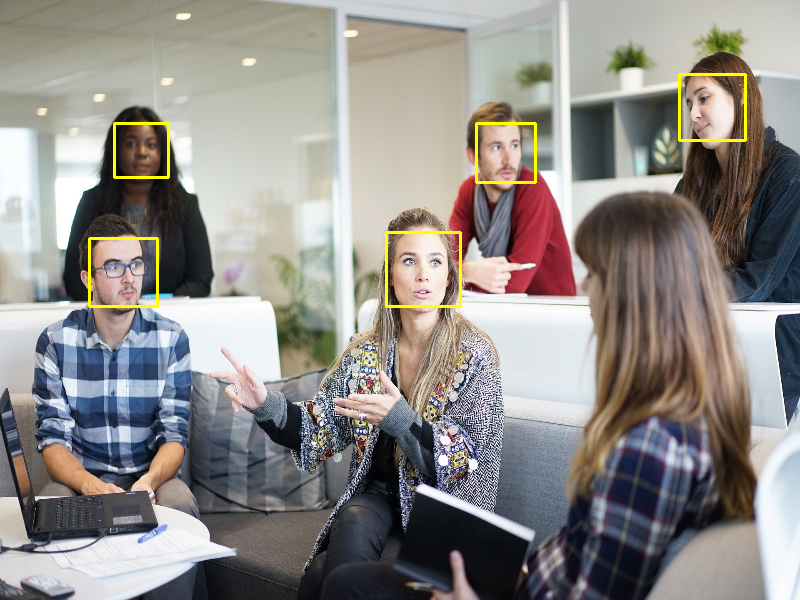

In [14]:
detections = face_detector.detectMultiScale(img_gray, scaleFactor=1.08)

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), YELLOW, thickness=2)

cv2_imshow(img)

Only changing the `scaleFactor` was possible to eliminate the false positive

In other image

In [15]:
img_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/images/people2.jpg"

In [16]:
img      = cv.imread(img_url)
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

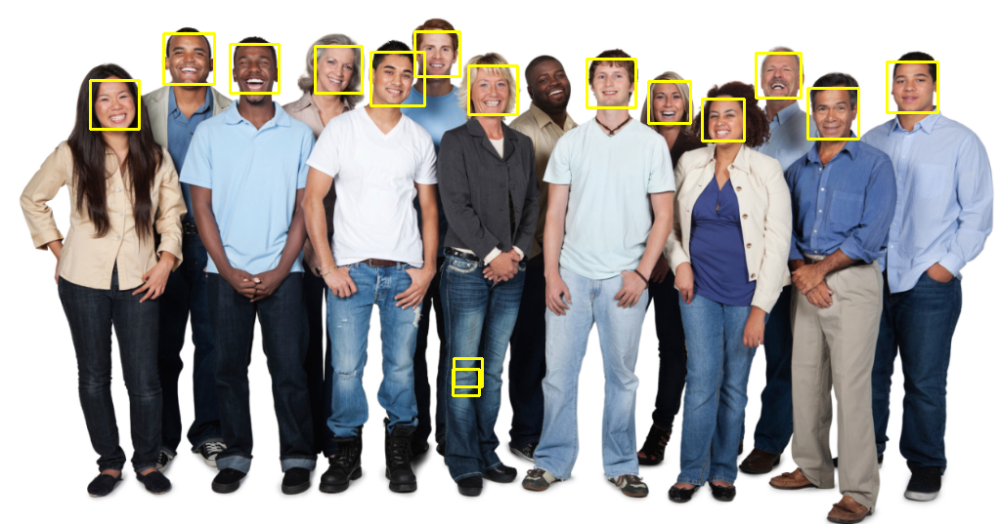

In [17]:
detections = face_detector.detectMultiScale(img_gray, scaleFactor=1.08)

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), YELLOW, thickness=2)

cv2_imshow(img)

The same parameters values don't work in different images.

Let's change a little

In [18]:
img      = cv.imread(img_url)
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

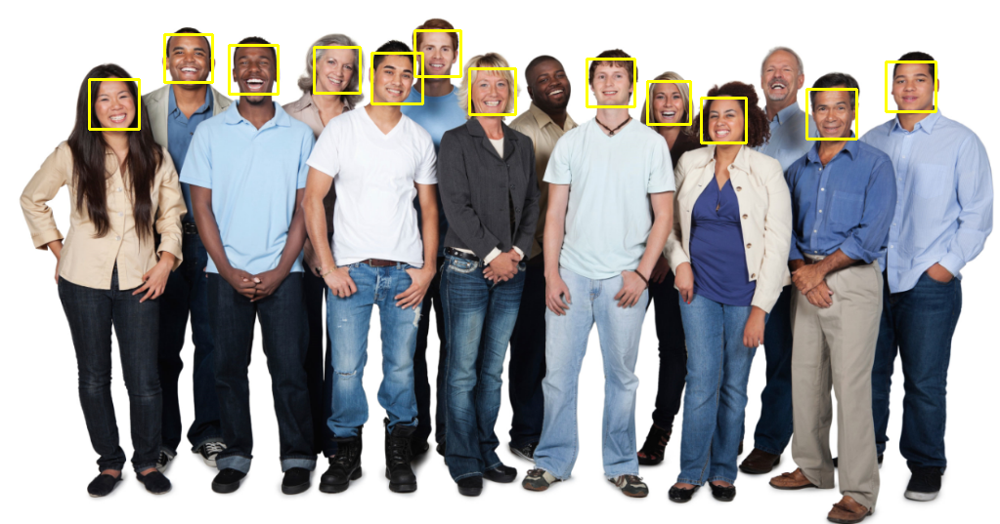

In [19]:
detections = face_detector.detectMultiScale(img_gray, scaleFactor=1.2, minNeighbors=7)

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), YELLOW, thickness=2)

cv2_imshow(img)

In this configuration we eliminated 2 false positives but can't indentify 2 faces

### Eye Detection

In [20]:
img_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/images/people1.jpg"

In [21]:
haarcascades_eye_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/cascades/haarcascade_eye.xml"

eye_detector = cv.CascadeClassifier(haarcascades_eye_url)

In [22]:
img      = cv.imread(img_url)
img      = cv.resize(img, (800, 600))
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

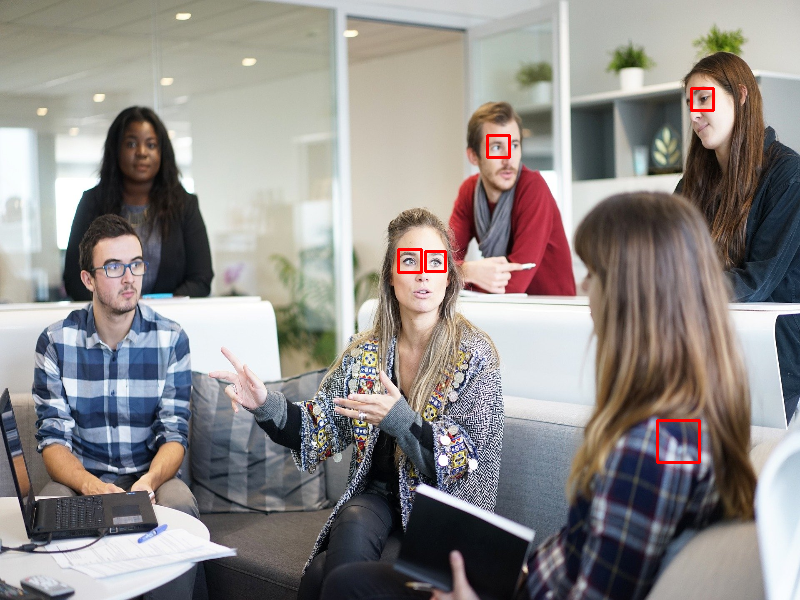

In [23]:
detections = eye_detector.detectMultiScale(img_gray)

RED = (0, 0, 255)

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), RED, thickness=2)

cv2_imshow(img)

#### Changing Parameters

In [24]:
img      = cv.imread(img_url)
img      = cv.resize(img, (800, 600))
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

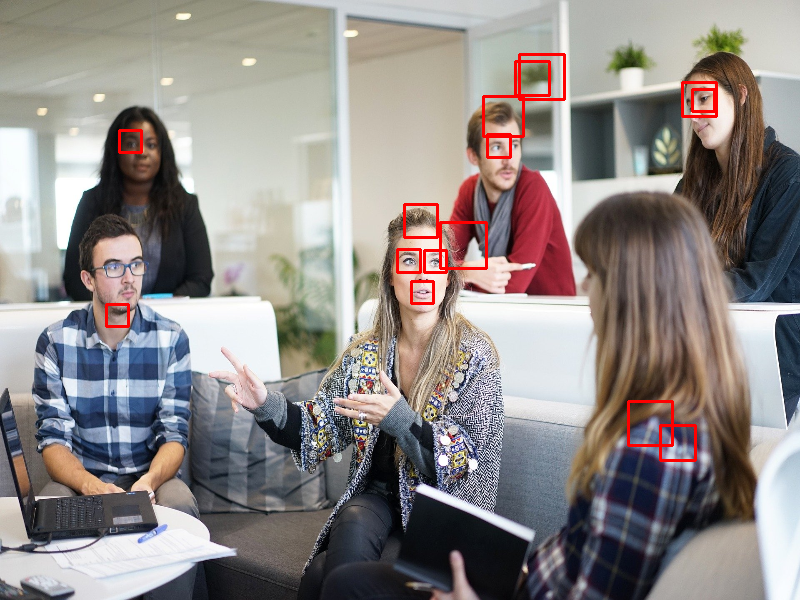

In [25]:
detections = eye_detector.detectMultiScale(img_gray, scaleFactor=1.05, minNeighbors=2)

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), RED, thickness=2)

cv2_imshow(img)

Not changing image scale

In [26]:
img      = cv.imread(img_url)
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

In [27]:
detections = eye_detector.detectMultiScale(img_gray, scaleFactor=1.08, minNeighbors=10)

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), RED, thickness=2)

cv2_imshow(img)

Output hidden; open in https://colab.research.google.com to view.

Removing false positive

In [28]:
img      = cv.imread(img_url)
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

In [29]:
detections = eye_detector.detectMultiScale(img_gray, scaleFactor=1.08, minNeighbors=10, maxSize=(70, 70))

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), RED, thickness=2)

cv2_imshow(img)

Output hidden; open in https://colab.research.google.com to view.

Now, all eyes are identified.

We can resize image again

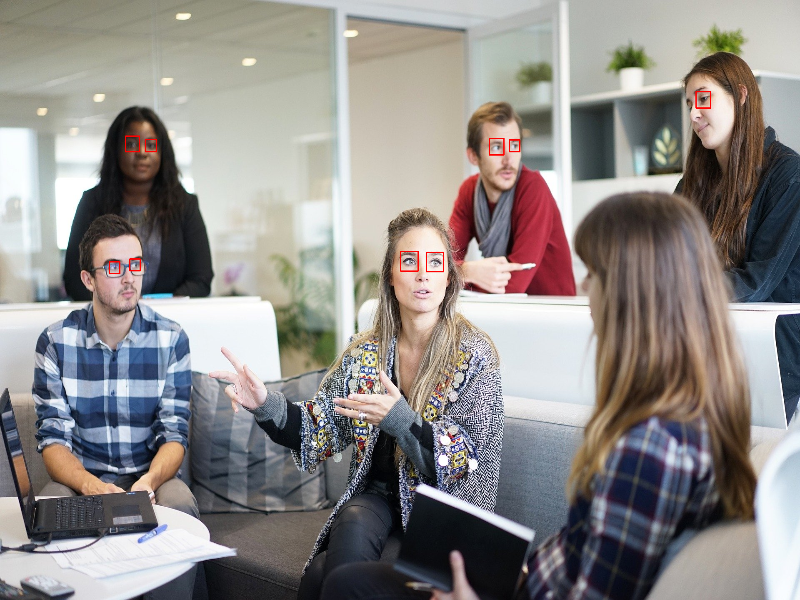

In [30]:
img = cv.resize(img, (800, 600))

cv2_imshow(img)

### Other objects

#### Car

In [31]:
img_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/images/car.jpg"

In [32]:
haarcascades_car_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/cascades/cars.xml"

car_detector = cv.CascadeClassifier(haarcascades_car_url)

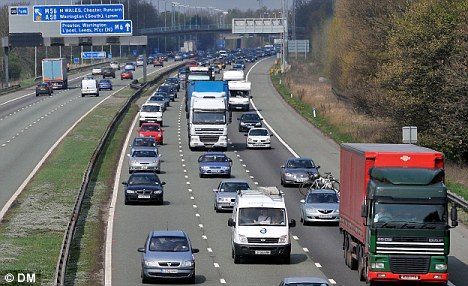

In [33]:
img = cv.imread(img_url)

img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

cv2_imshow(img)

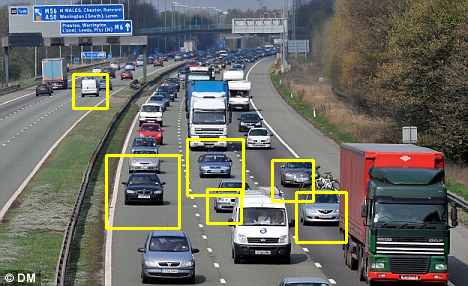

In [34]:
detections = car_detector.detectMultiScale(img_gray, scaleFactor=1.05)

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), YELLOW, thickness=2)

cv2_imshow(img)

#### Clock

In [35]:
img_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/images/clock.jpg"

In [36]:
haarcascades_clock_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/cascades/clocks.xml"

clock_detector = cv.CascadeClassifier(haarcascades_clock_url)

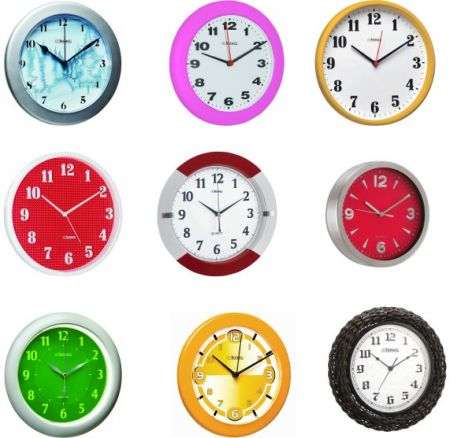

In [37]:
img = cv.imread(img_url)

img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

cv2_imshow(img)

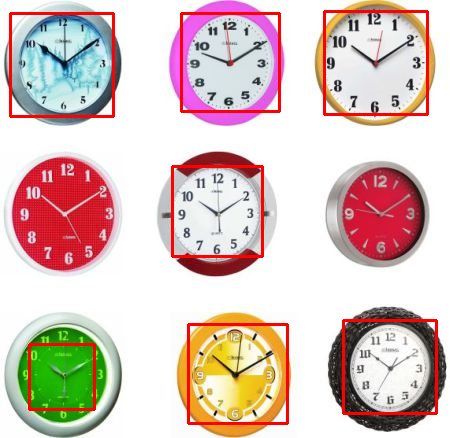

In [38]:
detections = clock_detector.detectMultiScale(img_gray, scaleFactor=1.01, minNeighbors=8)

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), RED, thickness=2)

cv2_imshow(img)

#### Body

In [39]:
img_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/images/people3.jpg"

In [40]:
haarcascades_body_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/cascades/fullbody.xml"

body_detector = cv.CascadeClassifier(haarcascades_body_url)

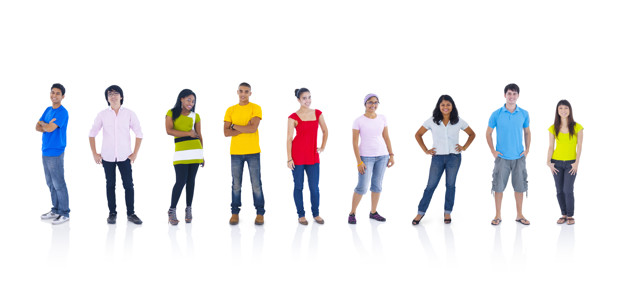

In [41]:
img = cv.imread(img_url)

img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

cv2_imshow(img)

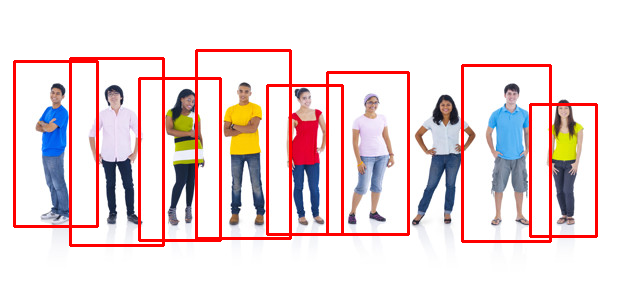

In [42]:
detections = body_detector.detectMultiScale(img_gray, scaleFactor=1.05, minSize=(50, 50))

for x, y, w, h in detections:
  cv.rectangle(img, (x, y), (x + w, y + h), RED, thickness=2)

cv2_imshow(img)

# HOG (Histograms of Oriented Gradients)

<p align="center">
  <img src="https://learnopencv.com/wp-content/uploads/2016/11/hog-preprocessing.jpg">
</p>

- Derivate: allows to measure the degree of change
  - zero derivate: pratically don't have variation in colors
  - small derivate: low variation in colors
  - big derivate: great variation in colors
- Gradient vector: the direction that values increase

Using these 2 Calculu's concepts, we can generate this follow image

<p align="center">
  <img src="https://learnopencv.com/wp-content/uploads/2016/11/gradients.png">
  </br>
  Left : Absolute value of x-gradient.
  </br>
  Center : Absolute value of y-gradient.
  </br>
  Right : Magnitude of gradient.
</p>

<p align="center">
  <img src="https://learnopencv.com/wp-content/uploads/2016/12/hog-cell-gradients-768x432.png">
</p>

The Gradient Magnitude show the part of window have more variation in colors

The Gradient Direction show the directions (degree) calculated by the pixels around

These values will be maped in histograms

<p align="center">
  <img src="https://learnopencv.com/wp-content/uploads/2016/12/hog-histogram-1.png">
</p>

For each value in Gradient Direction, the value in correspondent place of Gradient Magnitude will be added to the Histogram of Gradients

In cases like the value 10, we can divide in two places in Histogram of Gradients

The result, for a face (example), will be somethin like this

<p align="center">
  <img height=400 src="https://upload.wikimedia.org/wikipedia/commons/c/c5/Dlib_Learned-HOG-Detector.jpg">
</p>

# Dlib

Dlib is a set of independent software components

In [43]:
import dlib

In [44]:
img_url = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/images/people2.jpg"

## With HOG

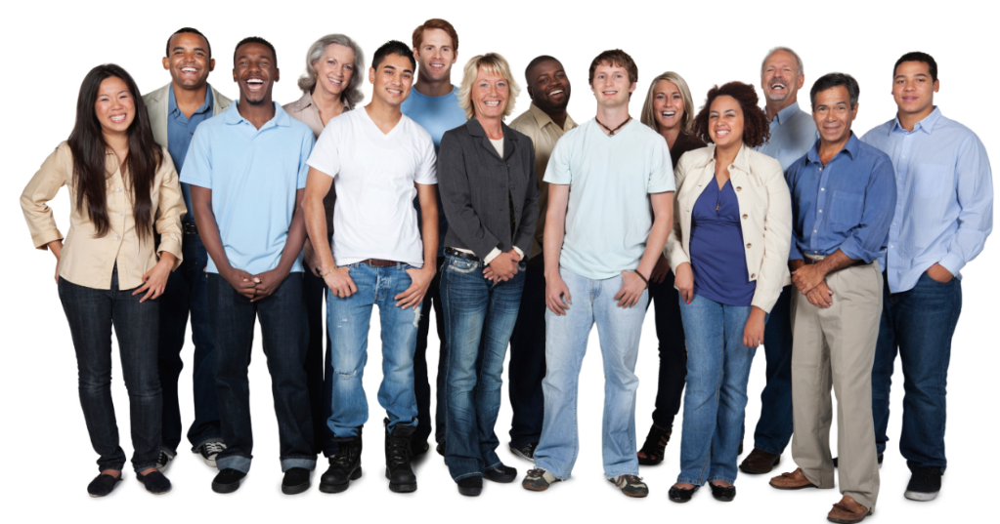

In [45]:
img = cv.imread(img_url)

cv2_imshow(img)

In [46]:
hog_face_detector = dlib.get_frontal_face_detector()

In [47]:
img_scale  = 1
detections = hog_face_detector(img, img_scale)

for face in detections:
  print(face)

[(429, 38) (465, 74)]
[(665, 90) (701, 126)]
[(717, 103) (760, 146)]
[(909, 70) (952, 113)]
[(828, 98) (871, 142)]
[(605, 70) (641, 106)]
[(777, 62) (813, 98)]
[(485, 78) (521, 114)]
[(386, 60) (429, 103)]
[(170, 41) (213, 84)]
[(93, 89) (136, 132)]
[(237, 50) (280, 94)]
[(323, 50) (367, 94)]
[(544, 65) (588, 108)]


The higher the value of image scale, the longer the time

In [48]:
for face in detections:
  print(face.left())
  print(face.right())
  print(face.top())
  print(face.bottom())

  break

429
465
38
74


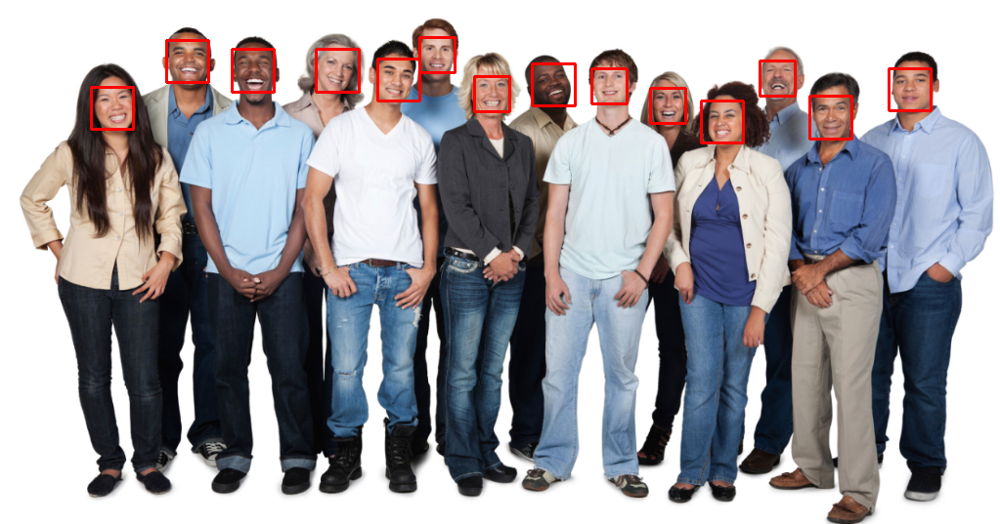

In [49]:
for face in detections:
  l, r, t, b = face.left(), face.right(), face.top(), face.bottom()

  cv.rectangle(img, (l, t), (r, b), RED, thickness=2)
  #l = x
  #t = y
  #r = x + w
  #b = y + h

cv2_imshow(img)

## With CNN

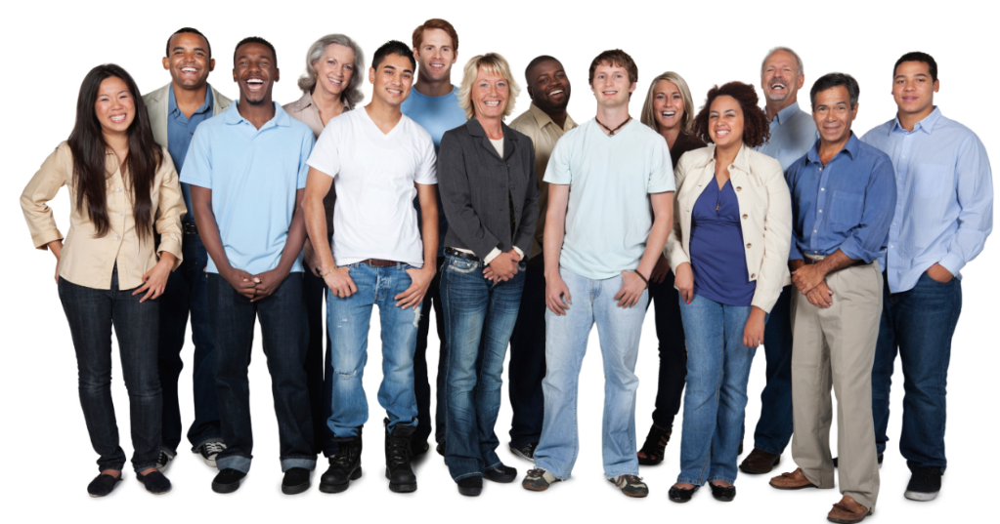

In [50]:
img = cv.imread(img_url)

cv2_imshow(img)

To work with cnn and dlib, we need to change the colab hardware accelerator to GPU

In [51]:
cnn_face_detector = dlib.cnn_face_detection_model_v1("/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Detection/weights/mmod_human_face_detector.dat")

confidence:  1.144
confidence:  1.137
confidence:  1.128
confidence:  1.12
confidence:  1.115
confidence:  1.113
confidence:  1.098
confidence:  1.094
confidence:  1.085
confidence:  1.08
confidence:  1.08
confidence:  1.078
confidence:  1.066
confidence:  1.064


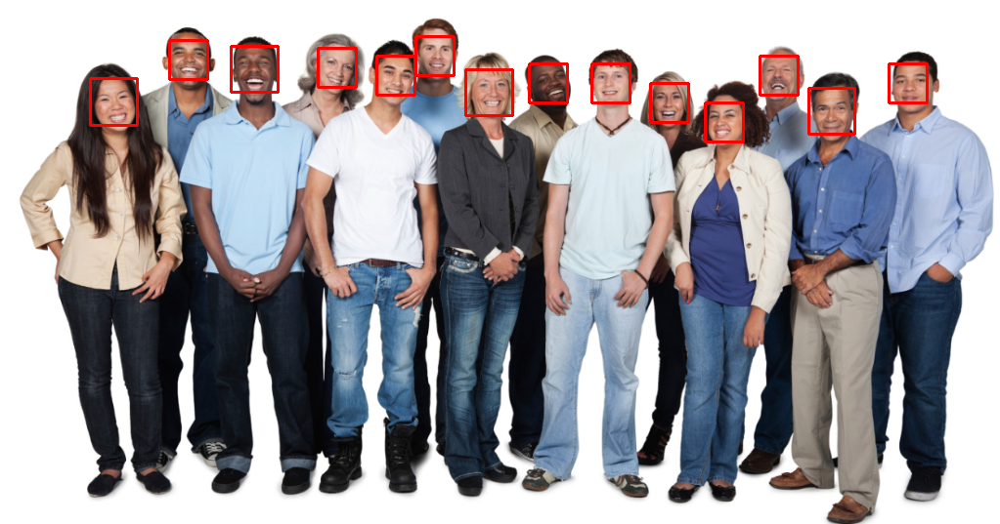

In [52]:
img_scale  = 1
detections = cnn_face_detector(img, img_scale)

for face in detections:
  l, r, t, b, c = face.rect.left(), face.rect.right(), face.rect.top(), face.rect.bottom(), face.confidence

  cv.rectangle(img, (l, t), (r, b), RED, thickness=2)

  print("confidence: ", round(c, 3))

cv2_imshow(img)

# Referencies

https://www.python.org/

https://opencv.org/

http://dlib.net/

https://www.udemy.com/share/105kta3@ooAfVkatgqpSKV1VF16mPNNje_G4hKtgyPgGU8RyXnIOwR4LhxSq-Ky4SgHKJdHuLA==/

https://learnopencv.com/histogram-of-oriented-gradients/

https://de.wikipedia.org/wiki/Histogram_of_oriented_gradients